In [1]:
import requests
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.stats import multivariate_normal, multivariate_t, norm
import networkx as nx
import yfinance as yf
import sys
sys.path.insert(0, 'C:/Users/ragna/Documents/Code/DyGraph/src')
sys.path.insert(0, 'C:/Users/ragna/Documents/Code/DyGraph')

import DyGraph as dg
import port_measures as pm
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
import scipy
from scipy.optimize import minimize

import pickle





In [2]:
def gen_all_all_zero(d,s, v1 = 1.1, v2 = 1.1):

    while True:
        # G =nx.erdos_renyi_graph(d, s, seed=42)


        # A = np.array(nx.adjacency_matrix(G).todense())
        # A[np.tril_indices(d)] = 0
        # U = np.random.binomial(1,0.5,  size = (d,d))
        # A = np.multiply(A, U*np.random.uniform(-0.6,-0.2, size = (d,d)) + (1-U)*np.random.uniform(0.2,0.6, size = (d,d)))
        # A = A+A.T
        # np.fill_diagonal(A, np.sum(np.abs(A),axis=1))


        k = d
        sparsity = s
        # generate the symmetric sparsity mask
        mask = np.random.uniform(size=(k,k))
        mask = mask * (mask < sparsity)
        mask[np.tril_indices(k,0)] = 0
        mask = mask + mask.T + np.identity(k)
        mask[mask > 0] = 1

        # generate the symmetric precision matrix
        A = np.random.uniform( size = (k,k))
        A[np.tril_indices(k,0)] = 0
        A = A + A.T + np.identity(k)

        # apply the reqired sparsity
        A = A * mask

        # force it to be positive definite
        l,u = np.linalg.eigh(A)
        A = A - (np.min(l)-.1) * np.identity(k)

        A2 = A.copy()
        A2_SIGNS = np.sign(A2)
        A2 = np.power(np.abs(A2), v1)
        A2 = A2*A2_SIGNS
        np.fill_diagonal(A2,np.diag(A))

        A3 = A2.copy()
        A3_SIGNS = np.sign(A3)
        A3 = np.power(np.abs(A3), v2)
        A3 = A3*A3_SIGNS
        np.fill_diagonal(A3,np.diag(A))


        try:
            np.linalg.inv(A)
            np.linalg.inv(A2)
            np.linalg.inv(A3)
        except:
            continue


        break

    return np.array([A, A2, A3])


def my_hdtest(Z, cov_Z, Y, cov_Y):

    d = Z.shape[1]
    n1 = Z.shape[0]
    n2 = Y.shape[0]



    za = (Z - np.mean(Z,0))
    vz = np.dot((za**2).T, za**2)/n1 - (2/n1 )*np.dot(za.T, za)*cov_Z + cov_Z**2


    ya = (Y - np.mean(Y,0))
    vy = np.dot((ya**2).T, ya**2)/n2 - (2/n2 )*np.dot(ya.T, ya)*cov_Y + cov_Y**2


    CLX = np.max((cov_Z-cov_Y)**2/(vz/n1+vy/n2))


    CLX_test = CLX-(4*np.log(d)-np.log(np.log(d)))
    p_val = 1 - np.exp(-np.exp(-CLX_test/2)/(np.sqrt(8*np.pi)))
    return p_val, CLX_test


def hdtest_boot(Z, cov_Z, Y, cov_Y, B):

    test_stat = np.zeros(B)

    X = np.vstack((Z,Y))

    _,t_stat_sample= my_hdtest(Z, cov_Z, Y, cov_Y)
    
    for i in range(B):
        
        #from sklearn.model_selection import train_test_split
        #X1_tmp, X2_tmp = train_test_split(X, test_size=0.5)

        X1_tmp = X[np.random.choice(X.shape[0], X.shape[0])]
        X2_tmp = X[np.random.choice(X.shape[0], X.shape[0])]
        p,test_stat[i] = my_hdtest(X1_tmp, cov_Z, X2_tmp, cov_Y) # out['statistics'][0] #
    
    return np.sum(test_stat >t_stat_sample)/len(test_stat),t_stat_sample,test_stat



def gen_local_change(d, s):

    k = d
    sparsity = s
    rnd = np.random.RandomState(42)
    while True:

        # generate the symmetric sparsity mask
        mask = rnd.uniform(size=(k,k))
        mask = mask * (mask < sparsity)
        mask[np.tril_indices(k,0)] = 0
        mask = mask + mask.T + np.identity(k)
        mask[mask > 0] = 1

        # generate the symmetric precision matrix
        A = rnd.uniform( size = (k,k))
        A[np.tril_indices(k,0)] = 0
        A = A + A.T + np.identity(k)

        # apply the reqired sparsity
        A = A * mask

        # force it to be positive definite
        l,u = np.linalg.eigh(A)
        A = A - (np.min(l)-.5) * np.identity(k)

        A2 = A.copy()
        shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
        shut_index = shut_index +shut_index.T
        np.fill_diagonal(shut_index,1)
        shut_index = shut_index <0.3
        A2[shut_index] = 0


        for i in range(k):
            for j in range(i+1, k):
                if rnd.uniform()<0.3:
                    A2[i,j] = rnd.uniform(low = -1, high = 1)
                    A2[j,i] = A2[i,j]


        A3 = A2.copy()
        shut_index = rnd.uniform(low =0, high = 0.5, size = A.shape)
        shut_index = shut_index +shut_index.T
        np.fill_diagonal(shut_index,1)
        shut_index = shut_index <0.3
        A3[shut_index] = 0

        for i in range(k):
            for j in range(i+1, k):
                if rnd.uniform()<0.3:
                    A3[i,j] = rnd.uniform(low = -1, high = 1)
                    A3[j,i] = A3[i,j]



        try:
            u = np.linalg.eigvals(A)
            assert np.all(u>=0)
            u = np.linalg.eigvals(A2)
            assert np.all(u>=0)
            u = np.linalg.eigvals(A3)
            assert np.all(u>=0)
        except: 
            continue

        break




    return np.array([A, A2, A3])

In [3]:
def log_lik(mean,cov, X, liktype, nu = None, prec = None, gamma = None, n = 10):

    if liktype == "gaussian":
        lik = np.sum(multivariate_normal.logpdf(X, mean=mean, cov=cov, allow_singular=True))
    elif liktype == "t":
        lik = np.sum(multivariate_t.logpdf(X,loc = mean, shape=cov, df = nu))
    elif np.isin(liktype, ("skew-group-t", "group-t")):
        lik  = 0.0
        #print(X)
        for i in range(X.shape[0]):
            lik += np.log(dg.generalized_skew_t( X[i], prec, nu = nu, gamma = gamma, n = n))
    else:
        assert False, "likelihood not correct"

    return lik

def log_lik_all(w, thetas, X, lik_type, nus = None, gammas = None):

    if gammas is None:
        gammas = [None] * len(thetas)
    
    if nus is None:
        nus = [None] * len(thetas)

    lik_tmp = []
    for j in range(len(thetas)):
        lik_tmp.append(log_lik(np.zeros(thetas[j].shape[1]) ,np.linalg.inv(thetas[j]), X[j*w:(j+1)*w], liktype = lik_type, prec =thetas[j],  nu = nus[j], gamma = gammas[j]))

    return np.array(lik_tmp)
            
def find_nr_params(thetas, lik_type):
    
    nr_params_tmp = []
    for iii in range(len(thetas)):
        theta_t = thetas[iii].copy()
        theta_t[np.abs(theta_t)<1e-4] = 0
        if lik_type == 't':
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0) + 1.0)
        elif lik_type == 'group-t':
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0) + float(theta_t.shape[0]))
        elif lik_type == 'skew-group-t':
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0) + float(theta_t.shape[0]) + float(theta_t.shape[0]))
        else:
            nr_params_tmp.append(np.sum(theta_t[np.triu_indices(theta_t.shape[0],1)] != 0))

    return np.array(nr_params_tmp)




In [ ]:
d = 10
As = gen_local_change(10,0.6)


rnd = np.random.RandomState(10)

X1 = rnd.multivariate_normal(mean = np.zeros(d),  cov = np.linalg.inv(As[0]), size = 80)
X2 = rnd.multivariate_normal(mean = np.zeros(d),  cov =  np.linalg.inv(As[1]), size = 40)
X3 = rnd.multivariate_normal(mean = np.zeros(d),  cov =  np.linalg.inv(As[2]), size = 30)

X = np.vstack([X1,X2,X3])

alphas = np.linspace(0.001,0.2, 50)
kappas = [0.01, 0.05, 0.1]
AICs = np.empty((len(kappas), len(alphas)))

for k_cnt, kappa in enumerate(kappas):
    for a_cnt, alpha in enumerate(alphas):
        dg_opt1 = dg.dygl_inner_em(X, obs_per_graph = 50, max_iter = 10000, lamda = alpha, kappa = kappa, tol = 1e-6)
        dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)

        thetas = dg_opt1.theta
        liks = log_lik_all(50, thetas, X, 'gaussian')
        nr_params_val = find_nr_params(thetas, 'gaussian')
        AICs[k_cnt, a_cnt] = 2*(np.sum(nr_params_val) - np.sum(liks))


fig, ax = plt.subplots(1,1, figsize = (10,5))
ax.plot(alphas, AICs[0], label = 1)
ax.plot(alphas, AICs[1], label = 2)
ax.plot(alphas, AICs[2], label = 3)
ax.legend()

In [ ]:
# test

B = scipy.stats.bernoulli.rvs(p = 0.5, size = (45))   

reg_matrix = np.zeros((3,d,d))
for h in range(1):
    np.fill_diagonal(reg_matrix[h],0)
    reg_matrix[h][np.triu_indices(d,1)] = B*999999
    reg_matrix[h] = reg_matrix[h] + reg_matrix[h].T


dg_opt1 = dg.dygl_inner_em(X, obs_per_graph = 30, max_iter = 10000, lamda = reg_matrix, kappa = kappa, tol = 1e-6)
dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)




In [4]:
def plot_aic(graph_sampling_testing):
    
    X = graph_sampling_testing['X'] #np.vstack([X1,X2,X3])

    alphas = graph_sampling_testing['alphas']# np.linspace(0.01,0.5, 50)
    kappas = graph_sampling_testing['kappas'] #[0.01, 0.05, 0.1]
    AICs = np.empty((len(kappas), len(alphas)))

    for k_cnt, kappa in enumerate(kappas):
        for a_cnt, alpha in enumerate(alphas):
            dg_opt1 = dg.dygl_inner_em(graph_sampling_testing['X'], obs_per_graph = 50, max_iter = 10000, lamda = alpha, kappa = kappa, tol = 1e-6)
            dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)

            thetas = dg_opt1.theta
            liks = log_lik_all(50, thetas, X, 'gaussian')
            nr_params_val = find_nr_params(thetas, 'gaussian')
            AICs[k_cnt, a_cnt] = 2*(np.sum(nr_params_val) - np.sum(liks))


    fig, ax = plt.subplots(1,1, figsize = (10,5))
    ax.plot(alphas, AICs[0], label = 1)
    ax.plot(alphas, AICs[1], label = 2)
    ax.plot(alphas, AICs[2], label = 3)
    ax.legend()



def plot_prob_per_it(graph_sampling_testing, k_idx):
    nr_ce_it = graph_sampling_testing['p_distribution'].shape[3]
    # For binomial
    fig, ax = plt.subplots(20,3, figsize = (15,90))
    for i in range(20):
        for h in range(3):
            for k in [k_idx]:
                for a in range(len(graph_sampling_testing['alphas'])):
                    ax[i,h].plot(range(graph_sampling_testing['p_distribution'].shape[3]), graph_sampling_testing['p_distribution'][k,a,h,:,i], label = f'alpha {graph_sampling_testing["alphas"][a]}')
                    #A_est = graph_sampling_testing['thetas'][h,j,k][np.triu_indices(20,1)]
                    #A_est[np.abs(A_est)<1e-3] = 0
                    #ax[i,h].plot(range(graph_sampling_testing['p_distribution'].shape[3]),[1-np.abs(np.sign(A_est[i]))]*61, color = 'orange')
            A_true = graph_sampling_testing['As'][h][np.triu_indices(10,1)]
            ax[i,h].plot(range(graph_sampling_testing['p_distribution'].shape[3]),[1-np.abs(np.sign(A_true[i]))]*nr_ce_it, color = 'black')
            #ax[i,h].set_xlabel('Iteration')
            ax[i,h].set_ylabel('p')
            ax[i,h].set_ylim((-0.1,1.1))
            ax[i,h].set_title(f"A_ij = {np.round(graph_sampling_testing['As'][h][np.triu_indices(10,1)][i],2)}")
        ax[i,2].legend(bbox_to_anchor = (1.1,1.1))


def plot_prob_per_it_multiple_models(args, labels,  a_idx, k_idx):
    nr_ce_it = args[0]['p_distribution'].shape[3]
    # For binomial
    fig, ax = plt.subplots(20,3, figsize = (15,90))
    for i in range(20):
        for h in range(3):
            for j in range(len(args)):
                ax[i,h].plot(range(args[j]['p_distribution'].shape[3]), args[j]['p_distribution'][k_idx,a_idx,h,:,i], label = labels[j])

            A_true = args[0]['As'][h][np.triu_indices(10,1)]
            ax[i,h].plot(range(args[0]['p_distribution'].shape[3]),[1-np.abs(np.sign(A_true[i]))]*nr_ce_it, color = 'black')
            #ax[i,h].set_xlabel('Iteration')
            ax[i,h].set_ylabel('p')
            ax[i,h].set_ylim((-0.1,1.1))
            ax[i,h].set_title(f"A_ij = {np.round(args[0]['As'][h][np.triu_indices(10,1)][i],2)}")
        ax[i,2].legend(bbox_to_anchor = (1.1,1.1))


def plot_auc(graph_sampling_testing):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,10))
    i = 1

    for j in range(len(graph_sampling_testing['alphas'])):
        y = np.concatenate((np.sign(np.abs(graph_sampling_testing['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(graph_sampling_testing['As'][1][np.triu_indices(10,1)])), np.sign(np.abs(graph_sampling_testing['As'][2][np.triu_indices(10,1)]))))
        pred = np.concatenate(( graph_sampling_testing['p_distribution'][i,j,0,-1],  graph_sampling_testing['p_distribution'][i,j,1,-1],  graph_sampling_testing['p_distribution'][i,j,2,-1]))

        fpr, tpr, thresholds = metrics.roc_curve(y, pred, pos_label=0)
        auc = metrics.roc_auc_score(1-y, pred)

        ax.plot(fpr, tpr,label="alpha = " + str(np.round(graph_sampling_testing['alphas'][j],2)) + ", auc="+str(np.round(auc,2)))
        ax.legend()

    ax.plot([0,1], [0,1],color = 'black')


def p_vs_abs_edge(graph_sampling_testing, as_test = [1,3, 6]):
    fig, ax = plt.subplots(len(as_test),2, figsize = (15,20))
    for cnt, a in enumerate(as_test): #range(len(graph_sampling_testing['alphas'])):
        for k in range(2):
            ax[cnt,k].scatter(1-graph_sampling_testing['p_distribution'][k, a, 0,-1,:],np.abs(graph_sampling_testing['As'][0][np.triu_indices(10,1)]), label = '1', color = 'blue')
            ax[cnt,k].scatter(1-graph_sampling_testing['p_distribution'][k, a, 1,-1,:],np.abs(graph_sampling_testing['As'][1][np.triu_indices(10,1)]), label = '2', color = 'blue' )
            ax[cnt,k].scatter(1-graph_sampling_testing['p_distribution'][k, a, 2,-1,:],np.abs(graph_sampling_testing['As'][2][np.triu_indices(10,1)]), label = '3', color = 'blue' )
            ax[cnt,k].set_ylabel("Absolute edge")
            ax[cnt,k].set_xlabel("Probability")
            ax[cnt,k].set_xlim((0,1))
            ax[cnt,k].set_title(f"alpha {np.round(graph_sampling_testing['alphas'][a],2)} kappa {graph_sampling_testing['kappas'][k]}")
            ax[cnt,k].legend()
            ax[cnt,k].set_ylim((-0.1,2))
            ax[cnt,k].set_xlim((-0.05,1.05))



def p_vs_abs_edge_kde(graph_sampling_testing, as_test = [1, 3, 6]):
    from scipy.stats import gaussian_kde
    fig, ax = plt.subplots(len(as_test),2, figsize = (15,15))
    for cnt, a in enumerate(as_test): #range(len(graph_sampling_testing['alphas'])):
        for k in range(2):
            x = np.concatenate((1-graph_sampling_testing['p_distribution'][k, a, 0,-1,:], 1-graph_sampling_testing['p_distribution'][k, a, 1,-1,:], 1-graph_sampling_testing['p_distribution'][k, a, 2,-1,:]))
            y = np.concatenate((np.abs(graph_sampling_testing['As'][0][np.triu_indices(10,1)]), np.abs(graph_sampling_testing['As'][1][np.triu_indices(10,1)]), np.abs(graph_sampling_testing['As'][2][np.triu_indices(10,1)])))
            xy = np.vstack([x,y])
            z = gaussian_kde(xy)(xy)

            ax[cnt,k].scatter(x, y, c=z, s=100)
            ax[cnt,k].set_ylabel("Absolute edge")
            ax[cnt,k].set_xlabel("Probability")
            ax[cnt,k].set_xlim((0,1))
            ax[cnt,k].set_title(f"alpha {np.round(graph_sampling_testing['alphas'][a],2)} kappa {graph_sampling_testing['kappas'][k]}")
            ax[cnt,k].legend()
            ax[cnt,k].set_ylim((-0.1,2))
            ax[cnt,k].set_xlim((-0.05,1.05))


# Unkown shift Multiple runs

In [7]:
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_cai_xs_xs_False_tp_0.8.pkl', 'rb') as handle:
    gst_cai_08 = pickle.load(handle)
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_cai_xs_xs_False_tp_0.9.pkl', 'rb') as handle:
    gst_cai_09 = pickle.load(handle)
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_zero-one_xs_xs_False_tp_0.8.pkl', 'rb') as handle:
    gst_zo_08 = pickle.load(handle)
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/unknown_cp_0.6_50_zero-one_xs_xs_False_tp_0.9.pkl', 'rb') as handle:
    gst_zo_09 = pickle.load(handle)

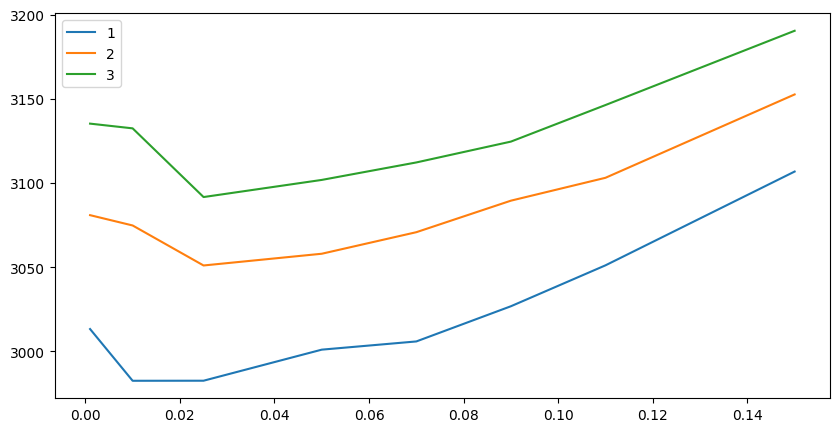

In [8]:
plot_aic(gst_cai_08)
#plot_aic(gst_cai_09)
#plot_aic(gst_zo_08)
#plot_aic(gst_zo_09)

In [ ]:
print(np.round(gst_cai_08['As'][0],2))
print(np.round(gst_cai_08['As'][1],2))

probability with iteration

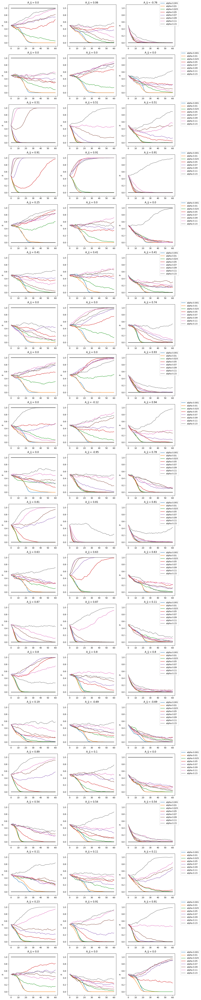

In [9]:
plot_prob_per_it(gst_cai_08,0)


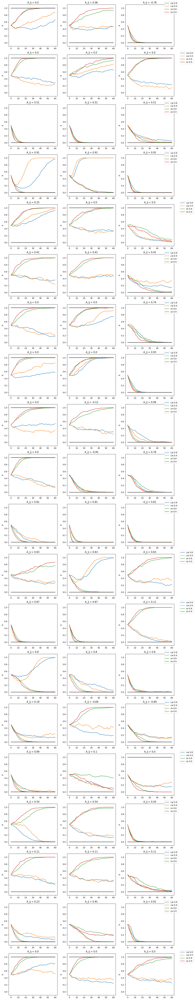

In [10]:
plot_prob_per_it_multiple_models([gst_cai_08, gst_cai_09, gst_zo_08, gst_zo_09], ['cai 0.8', 'cai 0.9', 'zo 0.8', 'zo 0.9'], 3, 0)

NameError: name 'P' is not defined

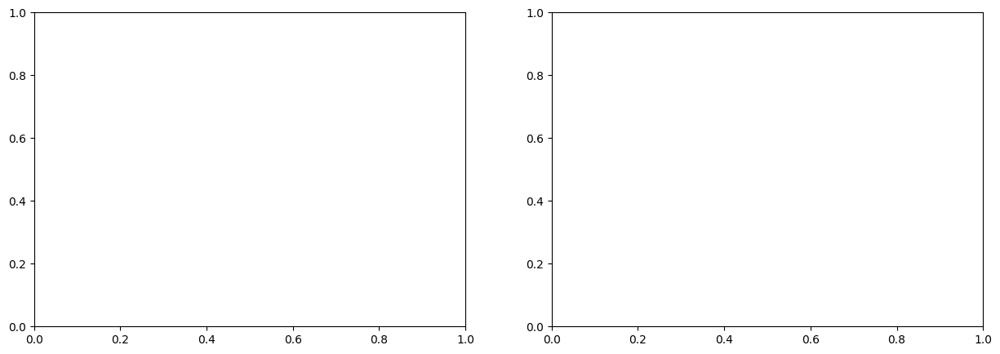

In [12]:
fig, ax = plt.subplots(1,2, figsize = (15,5))
sns.heatmap(1-P[0,4,0], ax = ax[0])
sns.heatmap(np.abs(As[0])/np.max(np.abs(As[0])), ax = ax[1])

histogram p

In [ ]:
graph_sampling_testing['p_distribution'][0,4,h,-1]

In [11]:
sns.kdeplot(graph_sampling_testing['p_distribution'][0,4,h,-1])

NameError: name 'graph_sampling_testing' is not defined

AUC

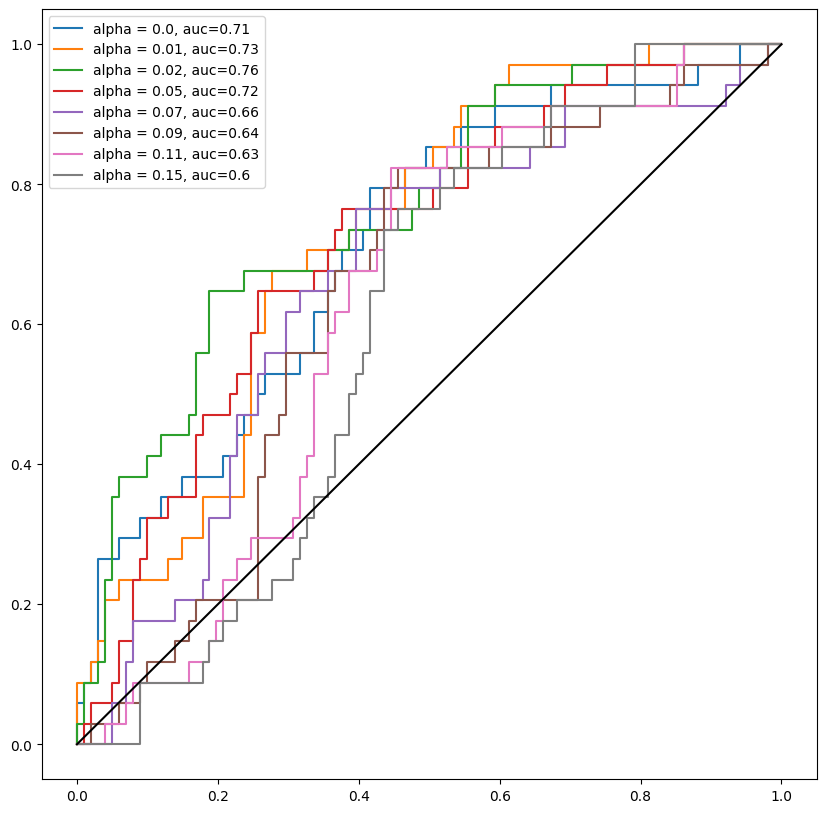

In [13]:
plot_auc(gst_zo_08)

P vs absolute edge

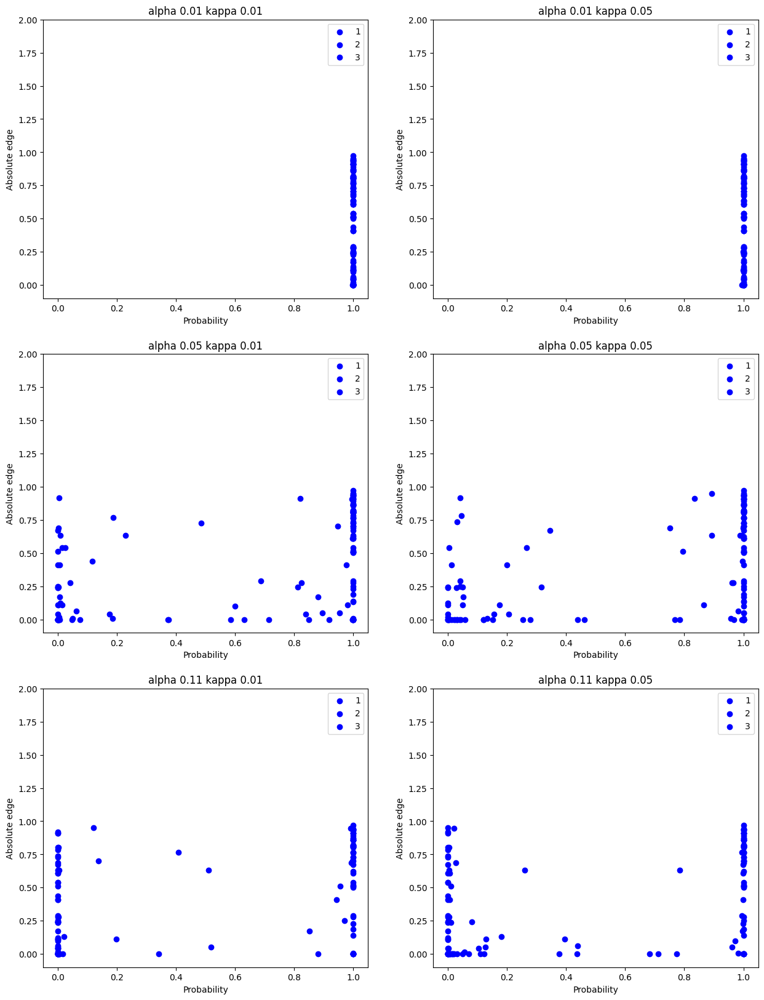

In [14]:
p_vs_abs_edge(gst_zo_08)

Plot P with time

In [ ]:
p_vs_abs_edge_kde(gst_zo_08)

Thetas simulated - One edge

In [16]:
i = 0
j = 2

xlim = (-1.5, 1.5)

As = graph_sampling_testing['As']
fig, ax = plt.subplots(1,3, figsize = (20, 5))
k = 0
for h in range(3):
    for a in range(len(graph_sampling_testing['alphas'])):
        theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
        sns.kdeplot(graph_sampling_testing['thetas_sim'][k,a,:,h,i,j], ax = ax[h], label =f'alpha {graph_sampling_testing["alphas"][a]}, p {np.round(P[k,a,h,i,j],2)}')
    #ax[h].axvline(x = theta_est[i,j], label = 'Dygl', color = 'black')
    ax[h].axvline(x = As[h][i,j], label = 'True', color = 'black', linestyle = 'dashed')
    ax[h].set_ylim((0,20))
    ax[h].legend()
    ax[h].set_xlim(xlim)
ax[1].set_title(f'kappa {graph_sampling_testing["kappas"][k]}, p ')

As = graph_sampling_testing['As']
fig, ax = plt.subplots(1,3, figsize = (20, 5))
k = 1
for h in range(3):
    for a in range(len(graph_sampling_testing['alphas'])):
        theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
        sns.kdeplot(graph_sampling_testing['thetas_sim'][k,a,:,h,i,j], ax = ax[h], label =f'alpha {graph_sampling_testing["alphas"][a]}, p {np.round(P[k,a,h,i,j],2)}')
    #ax[h].axvline(x = theta_est[i,j], label = 'Dygl', color = 'black')
    ax[h].axvline(x = As[h][i,j], label = 'True', color = 'black', linestyle = 'dashed')
    ax[h].set_ylim((0,20))
    ax[h].legend()
    ax[h].set_xlim(xlim)
ax[1].set_title(f'kappa {graph_sampling_testing["kappas"][k]}')

# As = graph_sampling_testing['As']
# fig, ax = plt.subplots(1,3, figsize = (20, 5))
# k = 2
# for h in range(2):
#     for a in range(len(graph_sampling_testing['alphas'])):
#         theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
#         sns.kdeplot(graph_sampling_testing['thetas_sim'][k,a,:,h,i,j], ax = ax[h], label =f'alpha {graph_sampling_testing["alphas"][a]}, p {np.round(P[k,a,h,i,j],2)}')
#     #ax[h].axvline(x = theta_est[i,j], label = 'Dygl', color = 'black')
#     ax[h].axvline(x = As[h][i,j], label = 'True', color = 'black', linestyle = 'dashed')
#     ax[h].set_ylim((0,20))
#     ax[h].legend()
#     ax[h].set_xlim(xlim)
# ax[1].set_title(f'kappa {graph_sampling_testing["kappas"][k]}')

NameError: name 'graph_sampling_testing' is not defined

Simulated thetes - CI

In [ ]:
graph_sampling_testing['thetas_sim'].shape

In [ ]:
np.mean(graph_sampling_testing['thetas_sim'][k,a,:,h], axis = 0 )

In [ ]:

fig, ax = plt.subplots(3,1, figsize = (20,15))
d = 10
colors = ['blue', 'red', 'green', 'pink', 'yellow']

#for a in range(len(alphas)):
a = 3
k = 0
for h in range(3):
    #theta_est = graph_sampling_testing['thetas'][k,a,h].copy()
    #theta_est[np.abs(theta_est)<1e-3] = 0
    #theta_u = theta_est[np.triu_indices(d,1)]
    mean_u = np.mean(graph_sampling_testing['thetas_sim'][k,a,:,h], axis = 0 )[np.triu_indices(d,1)]
    std_u = np.std(graph_sampling_testing['thetas_sim'][k,a,:,h], axis = 0 )[np.triu_indices(d,1)]
    A_true_u = graph_sampling_testing['As'][h].copy()[np.triu_indices(d,1)]


    ax[h].scatter(0, mean_u[0], label =f'ABC: alpha {np.round(graph_sampling_testing["alphas"][a],2)}', color = 'blue')
    #ax[h].scatter(0, theta_u[0], label =f'Dygl: alpha {np.round(graph_sampling_testing["alphas"][a],2)}', color = 'black')
    ax[h].scatter(0, A_true_u[0], marker = 'x', label ='True', color = 'orange')
    ax[h].errorbar(0, mean_u[0], 2*std_u[0], color = 'blue')

    ax[h].legend(bbox_to_anchor = (1,1))

    for i in range(1, 45):
        ax[h].scatter(i, mean_u[i], label =f'alpha {np.round(graph_sampling_testing["alphas"][a],2)} ABC', color = 'blue')
        #ax[h].scatter(i, theta_u[i], label =f'alpha {np.round(graph_sampling_testing["alphas"][a],2)}  Dygl', color = 'black')
        ax[h].scatter(i, A_true_u[i], marker = 'x', label ='True', color = 'orange')
        ax[h].errorbar(i, mean_u[i], 2*std_u[i], color = 'blue')

simulated thetas - kde edge paths

In [ ]:
graph_sampling_testing['thetas_sim'].shape

In [ ]:




k = 0
a = 1

theta_est = graph_sampling_testing['thetas'][k,a].copy()
As = np.array(graph_sampling_testing['As'])
theta_est[np.abs(theta_est)<1e-3] = 0
#std_u = np.std(thetas_sim[k,a,:], axis = 1 )

fig, ax = plt.subplots(20,3, figsize = (12,70))
n_i = 1
for n_j in range(0,10):
    for h in range(3):
        #ax[n_j,h].scatter([h], theta_est[h,n_i,n_j], label ='Estimate', color = 'black')
        ax[n_j,h].scatter([h], As[h,n_i,n_j], label ='True', color = 'orange', marker = 'x' )
        sns.kdeplot(y = graph_sampling_testing['thetas_sim'][k,a,-1,:,h,n_i,n_j], ax = ax[n_j,h])
        ax[n_j,h].set_ylim((-1,1))
    #ax.legend()

Test graph estimation

In [ ]:
graph_sampling_testing['X'].shape

In [ ]:
dg_opt1 = dg.dygl_inner_em(graph_sampling_testing['X'], obs_per_graph = 30, max_iter = 10000, lamda = 0.01, kappa =0.01, tol = 1e-4)
dg_opt1.fit(nr_workers=1, temporal_penalty="element-wise", lik_type="gaussian",verbose=False)

In [ ]:
i = 0
j = 6

fig, ax = plt.subplots(1,1, figsize = (10,5))

ax.plot(dg_opt1.theta[:,i,j], label = 'estimate')
ax.plot(graph_sampling_testing['As'][:,i,j],label =  'True')
ax.legend()

# Single unknown

single script runs where the change is unknown

In [8]:
# For binomial
colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow']
def plot_singles(args, labels, d, plot_bootstrap = True, nr_plot = 45):

    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow']
    fig, ax = plt.subplots(nr_plot,3, figsize = (15,4*nr_plot))


    for i in range(nr_plot):

        if plot_bootstrap:
            for h in range(3):
                for j in range(len(args)):
                    freq_boot = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,h])), axis = 0)[np.triu_indices(d,1)]
                    lll = args[j]['p_distribution'].shape[1]
                    ax[i,h].plot(range(lll), [1-freq_boot[i]]*lll, linestyle = '--', color = colors[j])

        for h in range(3):
            for j in range(len(args)):
                ax[i,h].plot(range(args[j]['p_distribution'].shape[1]), args[j]['p_distribution'][h,:,i], label = labels[j],  color = colors[j])
            A_true = args[0]['As'][h][np.triu_indices(10,1)]
            ax[i,h].plot(range(args[0]['p_distribution'].shape[1]),[1-np.abs(np.sign(A_true[i]))]*args[0]['p_distribution'].shape[1], color = 'black')
            #ax[i,h].set_xlabel('Iteration')
            ax[i,h].set_ylabel('p')
            ax[i,h].set_ylim((-0.1,1.1))
            ax[i,h].set_title(f"A_ij = {np.round(args[0]['As'][h][np.triu_indices(10,1)][i],2)}")
        ax[i,2].legend()



def plot_auc_singles(args, labels, it = -1, d = 10):
    from sklearn import metrics
    fig, ax = plt.subplots(1,1, figsize = (10,10))
    i = 1
    colors = ['red', 'blue', 'orange', 'green', 'grey', 'purple', 'yellow']
    for j in range(len(args)):
        y = np.concatenate((np.sign(np.abs(args[j]['As'][0][np.triu_indices(10,1)])), np.sign(np.abs(args[j]['As'][1][np.triu_indices(d,1)])), np.sign(np.abs(args[j]['As'][2][np.triu_indices(d,1)]))))
        pred = np.concatenate(( args[j]['p_distribution'][0,it],  args[j]['p_distribution'][1,it],  args[j]['p_distribution'][2,it]))

        fpr, tpr, thresholds = metrics.roc_curve(y, pred, pos_label=0)
        auc = metrics.roc_auc_score(1-y, pred)

        ax.plot(fpr, tpr,label=labels[j]+ ", auc="+str(np.round(auc,2)), color = colors[j])
       
        freq_boot0 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        freq_boot1 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        freq_boot2 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        pred = 1-np.concatenate((freq_boot0, freq_boot1, freq_boot2))

        fpr, tpr, thresholds = metrics.roc_curve(y, pred, pos_label=0)
        auc = metrics.roc_auc_score(1-y, pred)
        ax.plot(fpr, tpr,label=labels[j]+  " Freq. boot, auc="+str(np.round(auc,2)), color = colors[j], linestyle = '--')




    ax.plot([0,1], [0,1],color = 'black')
    ax.legend()


def p_vs_abs_edge_singles(args, labels, it = -1, d = 10):
    fig, ax = plt.subplots(len(args), figsize = (15,20))
    for j in range(len(args)): #range(len(graph_sampling_testing['alphas'])):
        ax[j].scatter(1-args[j]['p_distribution'][0,it,:],np.abs(args[j]['As'][0][np.triu_indices(d,1)]), label = '1', color = 'blue')
        ax[j].scatter(1-args[j]['p_distribution'][1,it,:],np.abs(args[j]['As'][1][np.triu_indices(d,1)]), label = '2', color = 'red' )
        ax[j].scatter(1-args[j]['p_distribution'][2,it,:],np.abs(args[j]['As'][2][np.triu_indices(d,1)]), label = '3', color = 'green' )
        ax[j].set_ylabel("Absolute edge")
        ax[j].set_xlabel("Probability")
        ax[j].set_xlim((0,1))
        ax[j].set_title(labels[j])
        ax[j].legend()
        ax[j].set_ylim((-0.1,2))
        ax[j].set_xlim((-0.05,1.05))


def p_vs_abs_edge_singles_boot(args, labels, d = 10):
    fig, ax = plt.subplots(len(args), figsize = (15,20))
    for j in range(len(args)): #range(len(graph_sampling_testing['alphas'])):

        freq_boot0 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,0])), axis = 0)[np.triu_indices(d,1)]
        freq_boot1 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,1])), axis = 0)[np.triu_indices(d,1)]
        freq_boot2 = np.mean(np.abs(np.sign(args[j]['thetas_sim'][:,2])), axis = 0)[np.triu_indices(d,1)]
        ax[j].scatter(freq_boot0,np.abs(args[j]['As'][0][np.triu_indices(d,1)]), label = '1', color = 'blue')
        ax[j].scatter(freq_boot1,np.abs(args[j]['As'][1][np.triu_indices(d,1)]), label = '2', color = 'red' )
        ax[j].scatter(freq_boot2,np.abs(args[j]['As'][2][np.triu_indices(d,1)]), label = '3', color = 'green' )
        ax[j].set_ylabel("Absolute edge")
        ax[j].set_xlabel("Probability")
        ax[j].set_xlim((0,1))
        ax[j].set_title(labels[j])
        ax[j].legend()
        ax[j].set_ylim((-0.1,2))
        ax[j].set_xlim((-0.05,1.05))


def plot_coefvar_singles(args, labels, d = 10):
    fig, ax = plt.subplots(1,3, figsize = (15,5))

    for h in range(3):
        ax[h].set_title("Coef. of variation of fitness, Graph nr: " + str(h+1))
        ax[h].set_ylabel("Coef. of variation")
        ax[h].set_xlabel("Iteration")
        for j in range(len(args)):
            ax[h].plot(np.std(args[j]['value_vals'][0], axis=1)/np.mean(args[j]['value_vals'][0], axis=1), label = labels[j], color = colors[j])
        ax[h].legend()






## alpha and kappa 

Plot probability convergence with specific tail probability, sparsity, metric

In [39]:
tp = 0.8
metric = 'zero-one'
s = 0.6
spar = 0.6
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.01_ni50_kFalse.pkl', 'rb') as handle:
    gst0 = pickle.load(handle)
    gst0['p_distribution'] = gst0['p']
    gst0['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.01_ni50_kFalse.pkl', 'rb') as handle:
    gst1 = pickle.load(handle)
    gst1['p_distribution'] = gst1['p']
    gst1['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.05_ni50_kFalse.pkl', 'rb') as handle:
    gst2 = pickle.load(handle)
    gst2['p_distribution'] = gst2['p']
    gst2['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.05_ni50_kFalse.pkl', 'rb') as handle:
    gst3 = pickle.load(handle)
    gst3['p_distribution'] = gst3['p']
    gst3['As'] = gen_local_change(10,spar)
    


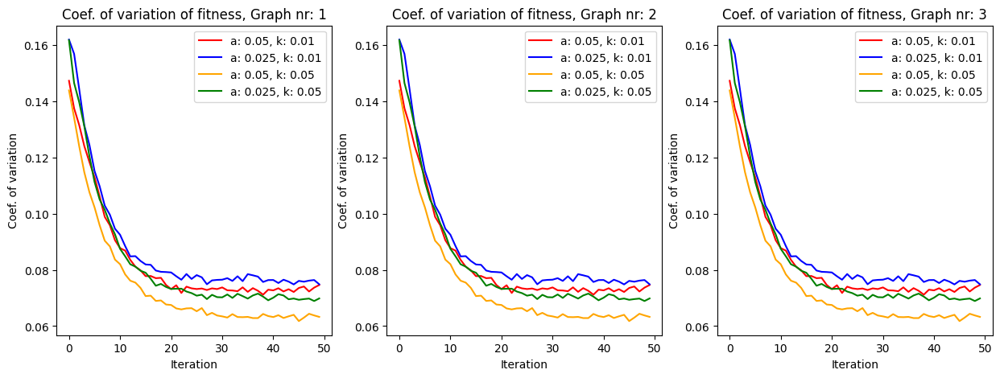

In [19]:
plot_coefvar_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)

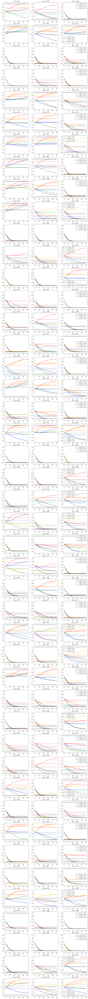

In [20]:

plot_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)

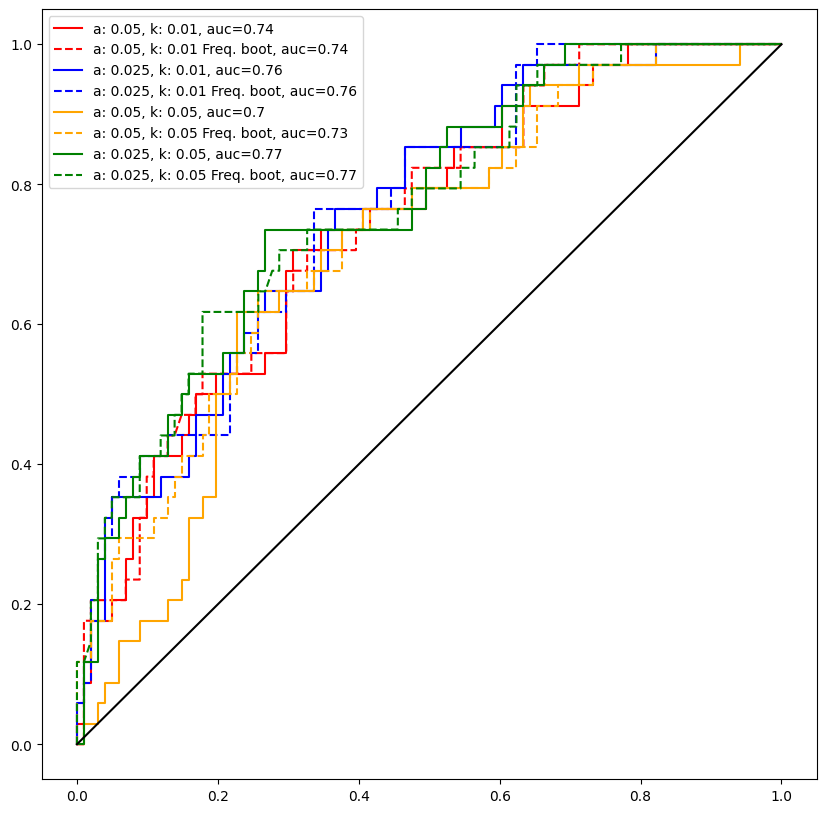

In [21]:

plot_auc_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], it = 15, d = 10)

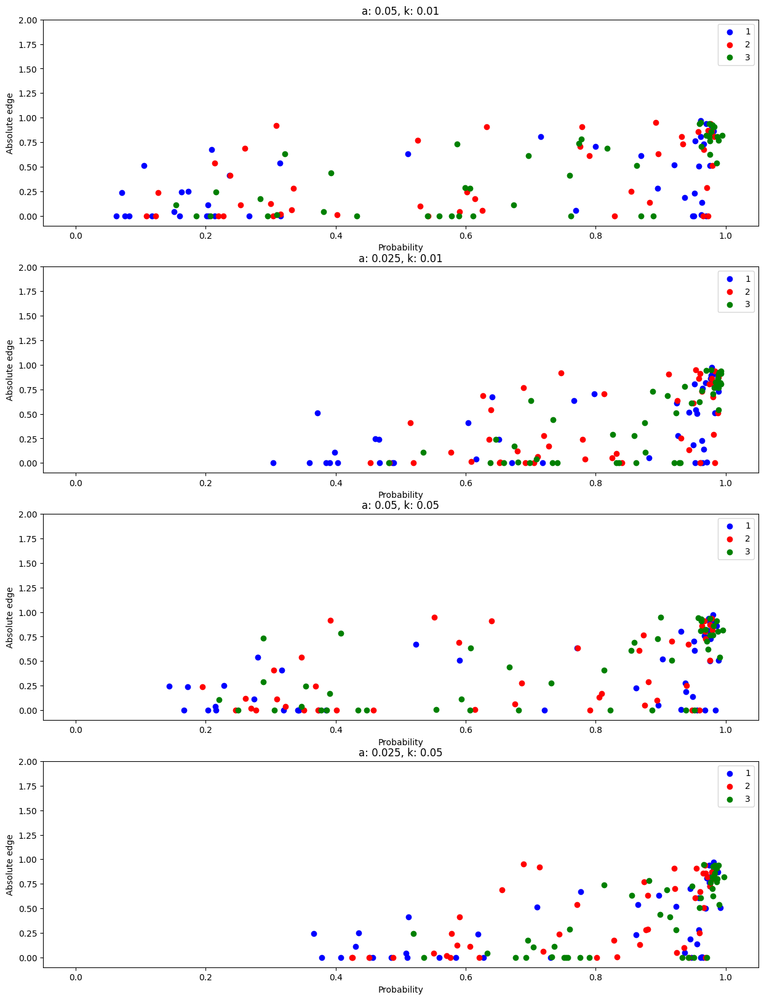

In [22]:
p_vs_abs_edge_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], it = 15)

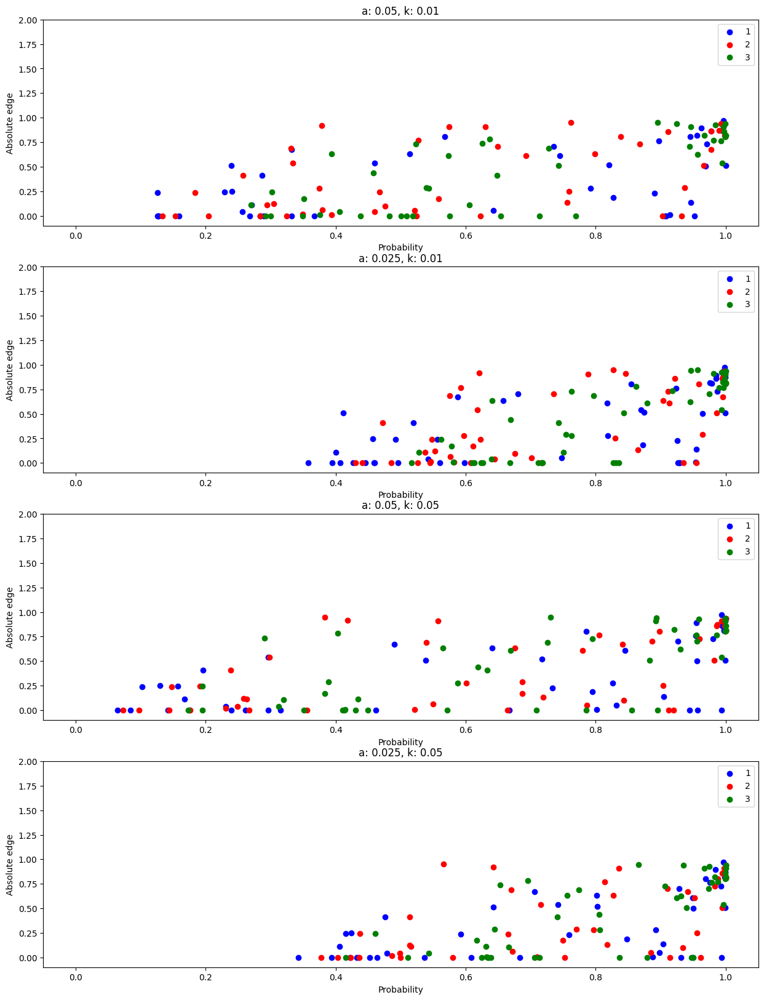

In [23]:

p_vs_abs_edge_singles_boot([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)

Cai tp0.8 sp0.6: More regulization, the higher the probability of absence. The higher the absolute value of the edge, the higher the probability of presence. AUC highest for a = 0.025, k = 0.05, lower sparsity regularization, higher temporal regularization. When we know 3 changes, but not when the change occured. Frequentist boostrap gives higher AUC


Cai tp0.8 sp0.3: More regulization, the higher the probability of absence. The higher the absolute value of the edge, the higher the probability of presence. Frequentist boostrap gives higher AUC


Zo tp0.8  sp0.6: More regulization, the higher the probability of absence. More degenerazy then the cai metric. Frequentist boostrap gives higher AUC but much closer than then for the Cai metric

Zo tp0.8  sp0.3: More regulization, the higher the probability of absence. More degenerazy then the cai metric. AUC almosth the same between the frequentist and CE.



## Compare Cai and Zero-One

In [31]:
tp = 0.6
metric = 'zero-one'
s = 0.6
spar = 0.6
k = 0.05
a = 0.025

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_zero-one_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    zo = pickle.load(handle)
    zo['p_distribution'] = zo['p']
    zo['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_cai_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    cai = pickle.load(handle)
    cai['p_distribution'] = cai['p']
    cai['As'] = gen_local_change(10,spar)


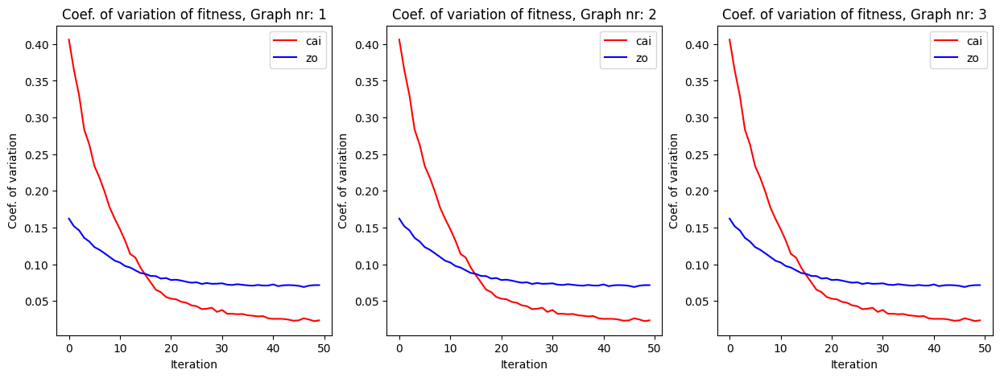

In [43]:
plot_coefvar_singles([cai, zo], ['cai', 'zo'], 10)

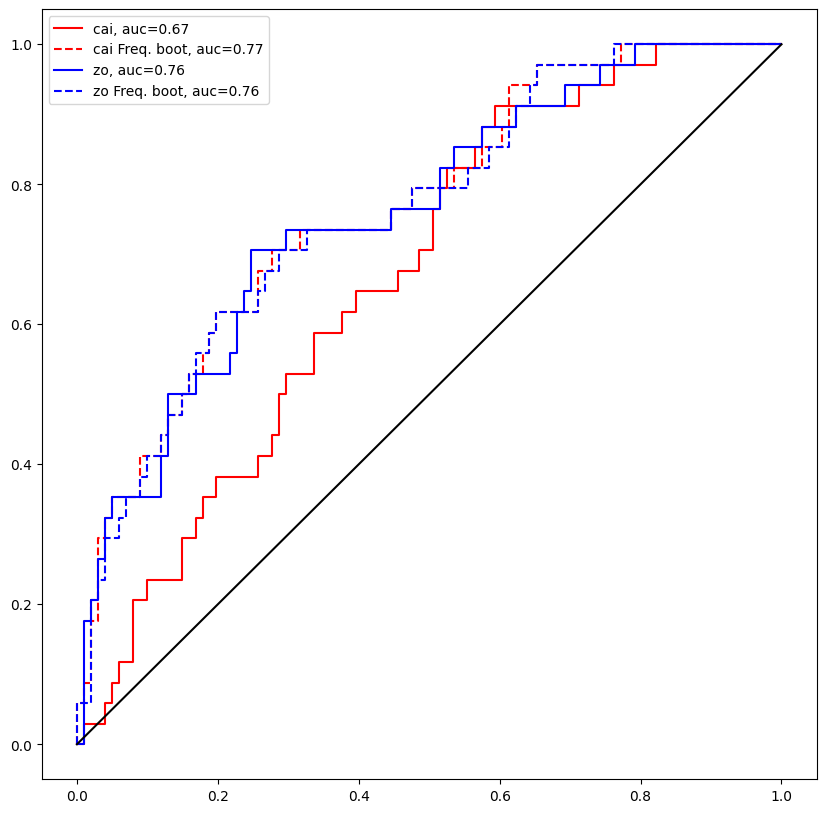

In [52]:

plot_auc_singles([cai, zo], ['cai', 'zo'], it = 15, d = 10)

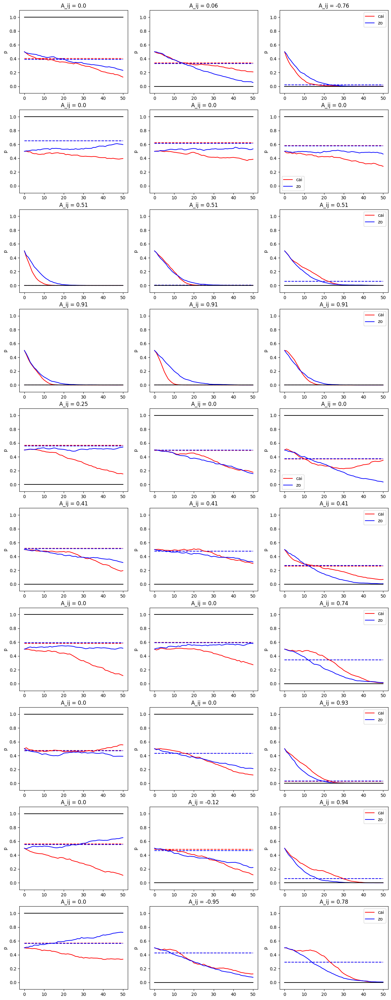

In [32]:
plot_singles([cai, zo], ['cai', 'zo'], d = 10, nr_plot = 10)

Not too dissimilr

## Compare Tail probability

In [42]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'cai'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.5_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp05 = pickle.load(handle)
    tp05['p_distribution'] = tp05['p']
    tp05['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.6_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp06 = pickle.load(handle)
    tp06['p_distribution'] = tp06['p']
    tp06['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.8_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp08 = pickle.load(handle)
    tp08['p_distribution'] = tp08['p']
    tp08['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.9_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    tp09 = pickle.load(handle)
    tp09['p_distribution'] = tp09['p']
    tp09['As'] = gen_local_change(10,spar)

    

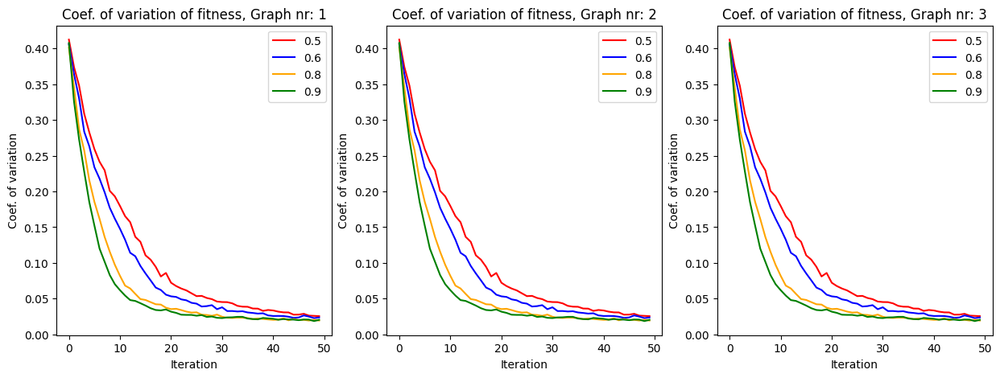

In [44]:
plot_coefvar_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], 10)

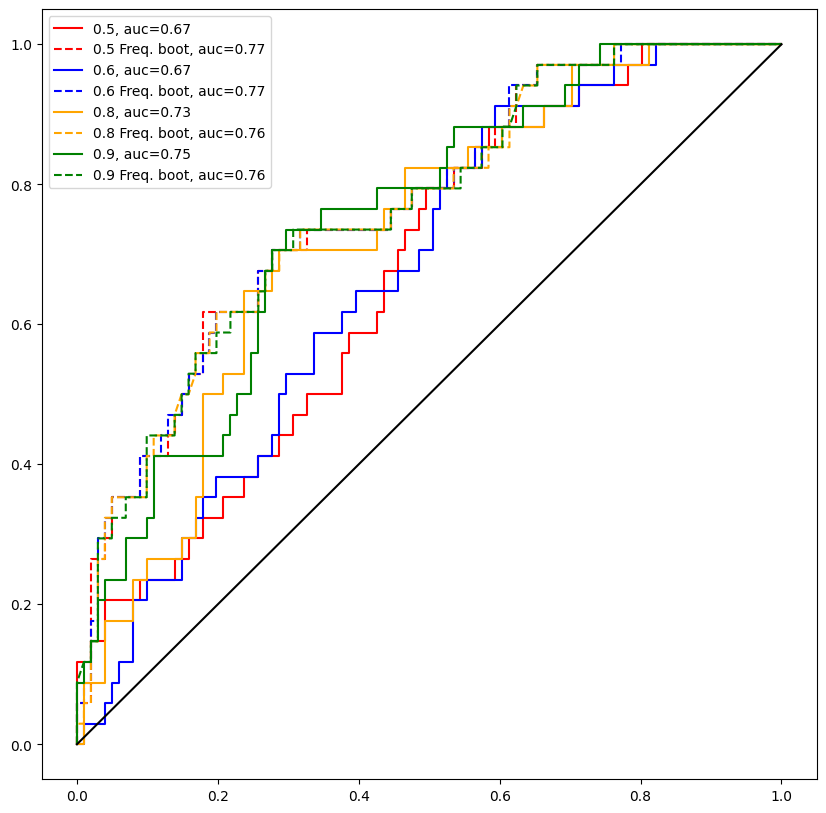

In [53]:

plot_auc_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], it = 15, d = 10)

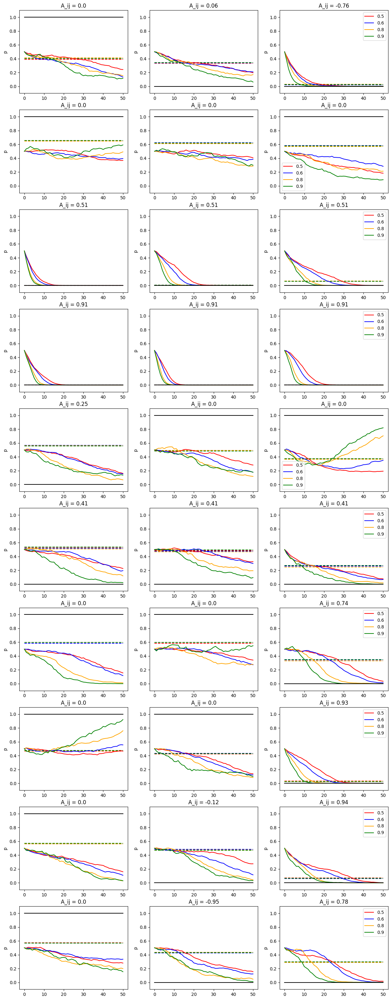

In [37]:
plot_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], d = 10, nr_plot = 10)

In our case we might be want lower tail probability

## Number of iterations

In [44]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'zero-one'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    CE5000 = pickle.load(handle)
    CE5000['p_distribution'] = CE5000['p']
    CE5000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_20000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kFalse.pkl', 'rb') as handle:
    CE20000 = pickle.load(handle)
    CE20000['p_distribution'] = CE20000['p']
    CE20000['As'] = gen_local_change(10,spar)

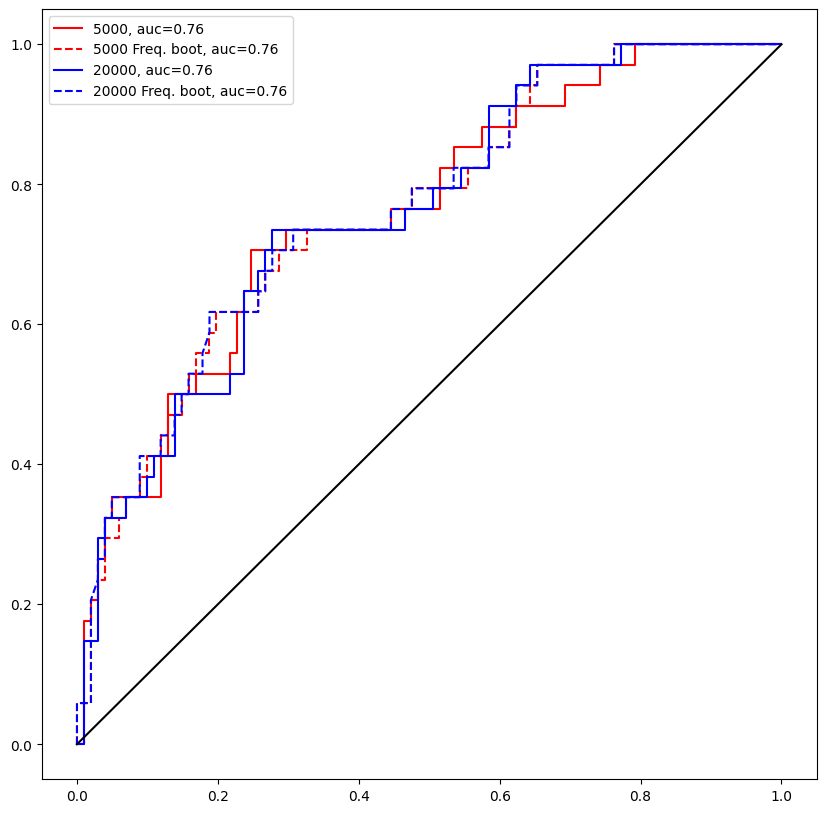

In [54]:

plot_auc_singles([CE5000, CE20000], ['5000', '20000'], it = 15, d = 10)

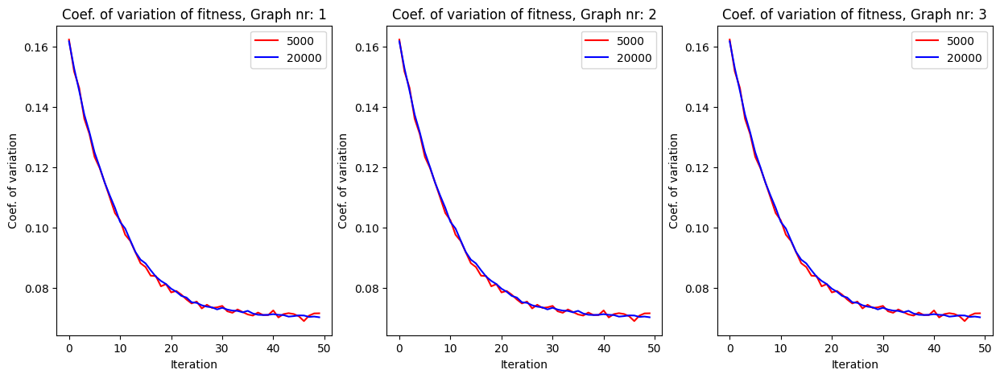

In [45]:
plot_coefvar_singles([CE5000, CE20000], ['5000', '20000'], 10)

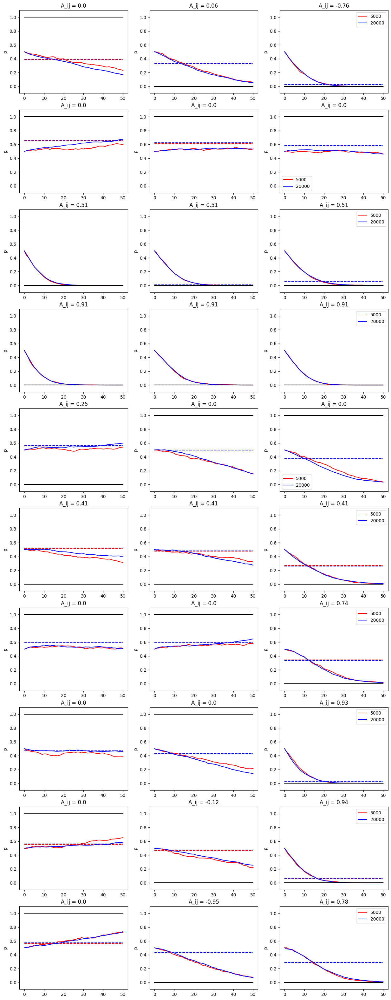

In [42]:
plot_singles([CE5000, CE20000], ['5000', '20000'], d = 10, nr_plot = 10)

No difference really

# Single known shift

Single scripts run where the change point is known

In [19]:
tp = 0.8
metric = 'cai'
s = 0.6
spar = 0.6
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.01_ni50_kTrue.pkl', 'rb') as handle:
    gst0 = pickle.load(handle)
    gst0['p_distribution'] = gst0['p']
    gst0['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.01_ni50_kTrue.pkl', 'rb') as handle:
    gst1 = pickle.load(handle)
    gst1['p_distribution'] = gst1['p']
    gst1['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.05_k0.05_ni50_kTrue.pkl', 'rb') as handle:
    gst2 = pickle.load(handle)
    gst2['p_distribution'] = gst2['p']
    gst2['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a0.025_k0.05_ni50_kTrue.pkl', 'rb') as handle:
    gst3 = pickle.load(handle)
    gst3['p_distribution'] = gst3['p']
    gst3['As'] = gen_local_change(10,spar)
    


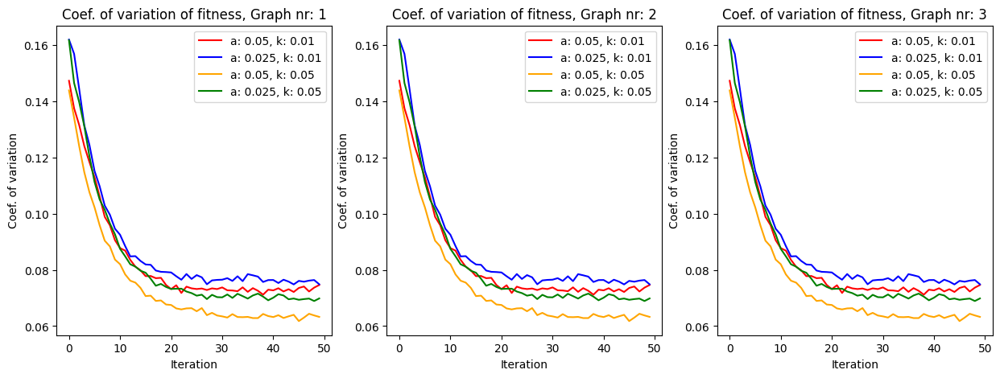

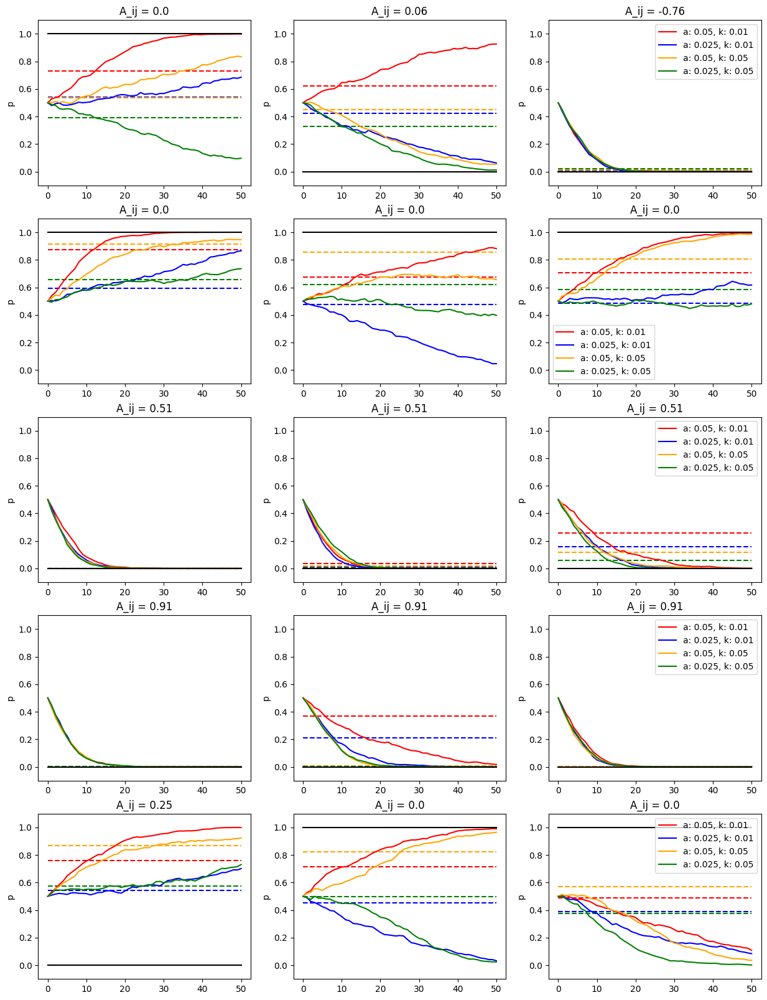

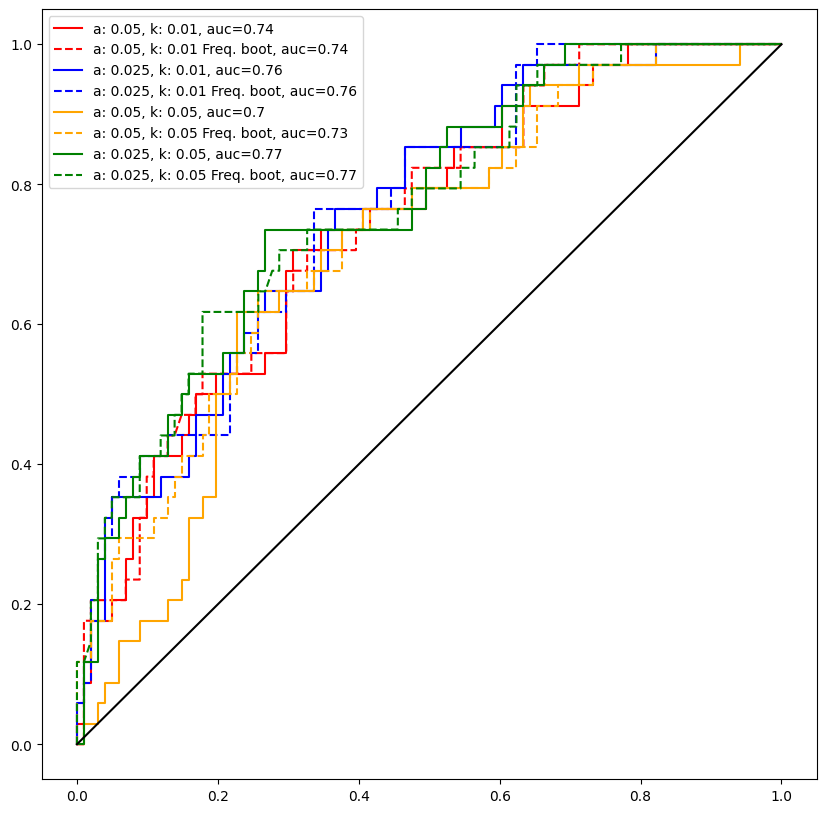

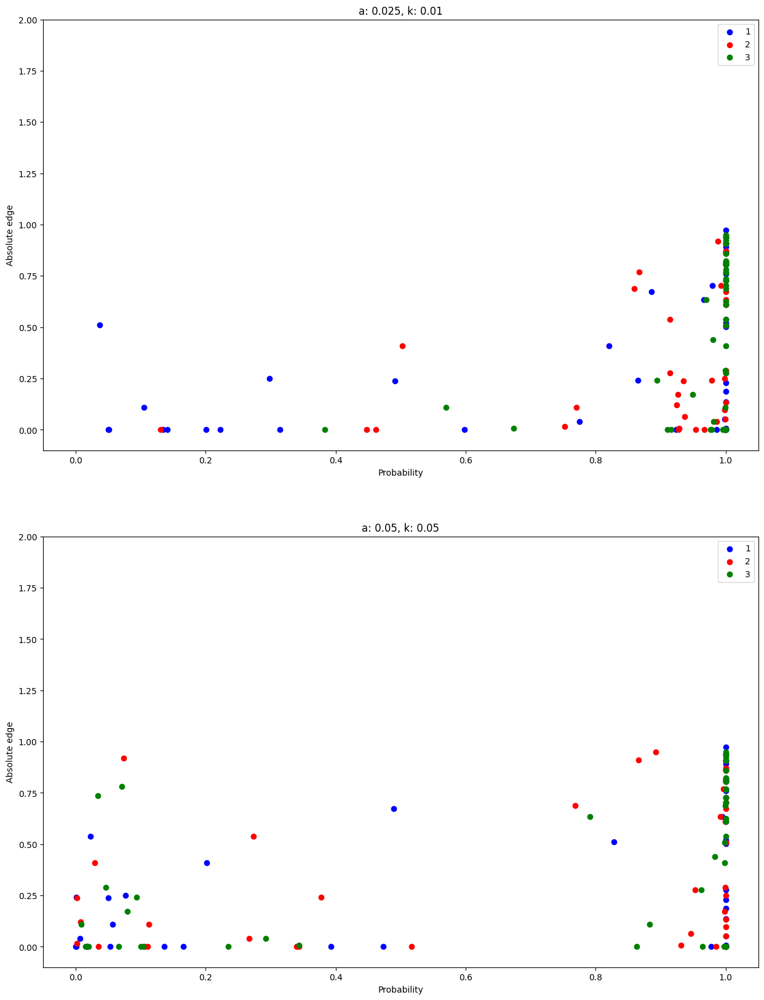

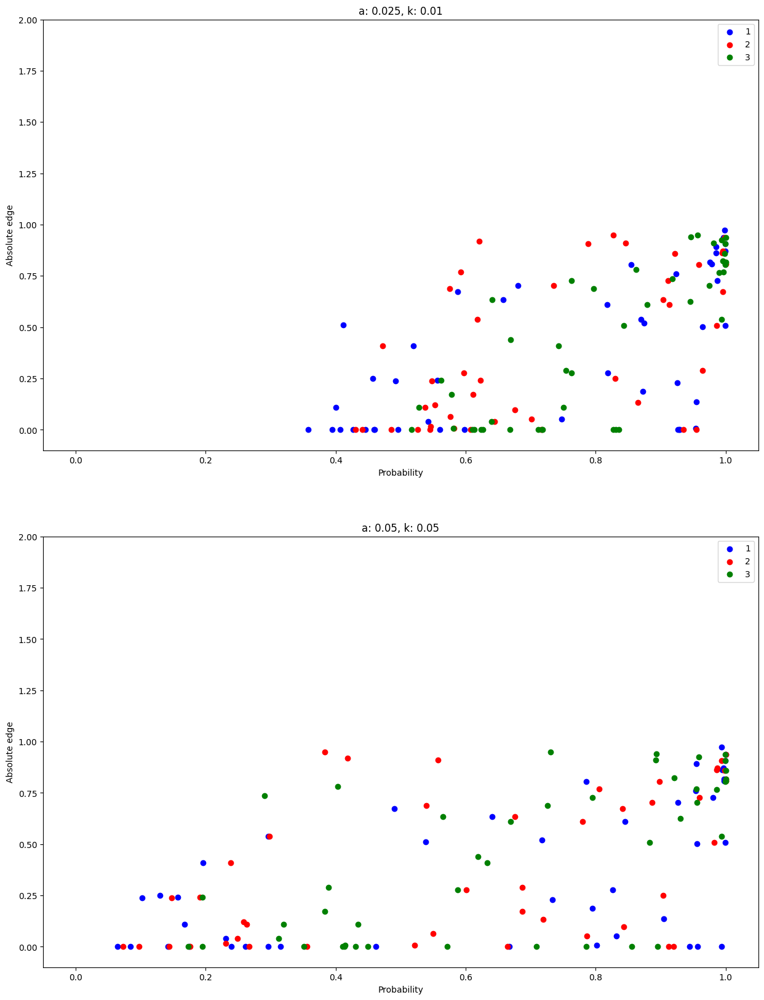

In [48]:
plot_coefvar_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)
plot_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10,  nr_plot = 5)
plot_auc_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], it = 15, d = 10)
p_vs_abs_edge_singles([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1, gst2]],it = -1)
p_vs_abs_edge_singles_boot([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1,gst2]], 10)

## Compare number per graph


In [54]:
tp = 0.8
metric = 'zero-one'
s = 0.6
spar = 0.6
a = 0.025
k = 0.01
with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w500_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    gst500 = pickle.load(handle)
    gst500['p_distribution'] = gst500['p']
    gst500['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    gst50 = pickle.load(handle)
    gst50['p_distribution'] = gst50['p']
    gst50['As'] = gen_local_change(10,spar)


    


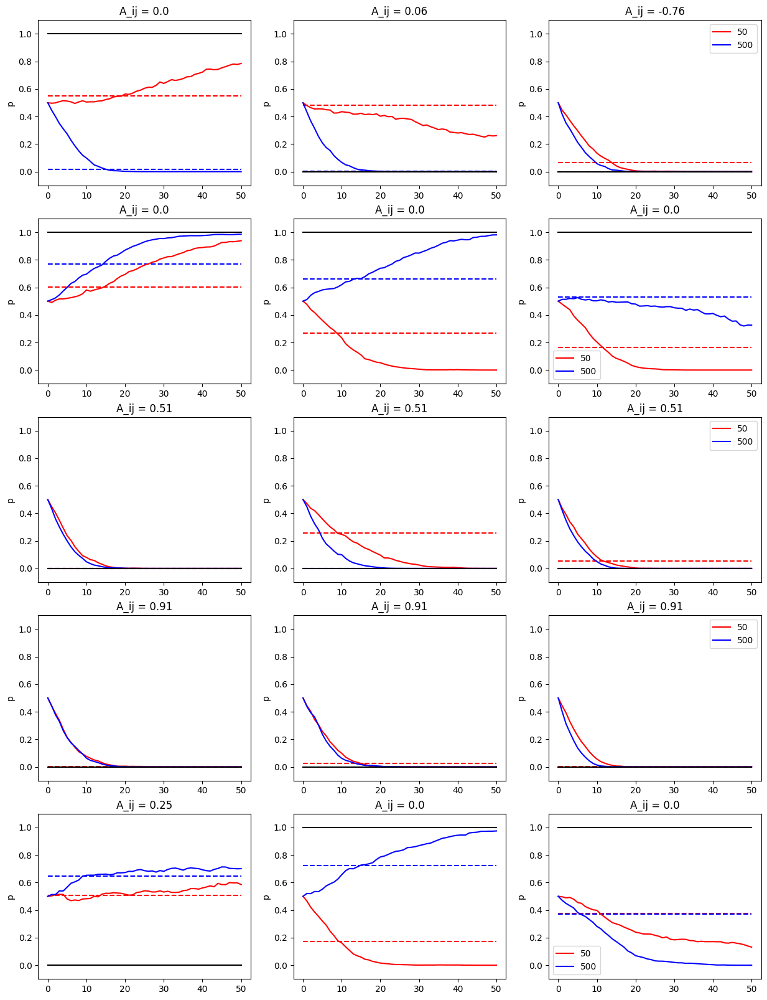

In [55]:
#plot_coefvar_singles([gst0, gst1, gst2, gst3], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst0, gst1, gst2, gst3]], 10)
plot_singles([gst50, gst500], ['50', '500'], 10,  nr_plot = 5)
plot_auc_singles([gst50, gst500], ['50', '500'], it = 15, d = 10)
#p_vs_abs_edge_singles([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1, gst2]],it = -1)
#p_vs_abs_edge_singles_boot([gst1,gst2], [f'a: {obj["alpha"]}, k: {obj["kappa"]}'for obj in [gst1,gst2]], 10)

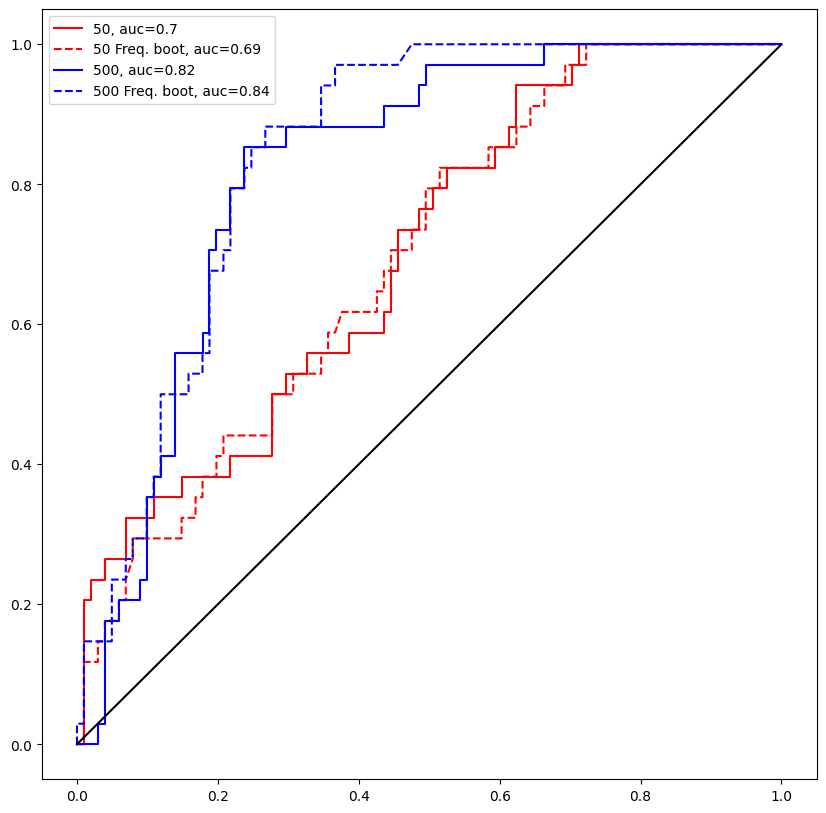

In [56]:
plot_auc_singles([gst50, gst500], ['50', '500'], it = 15, d = 10)

## Compare Cai and zero-one

In [35]:
tp = 0.6
metric = 'zero-one'
s = 0.6
spar = 0.6
k = 0.05
a = 0.025

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_zero-one_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    zo = pickle.load(handle)
    zo['p_distribution'] = zo['p']
    zo['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_cai_xs_xs_ew_s{0.6}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    cai = pickle.load(handle)
    cai['p_distribution'] = cai['p']
    cai['As'] = gen_local_change(10,spar)


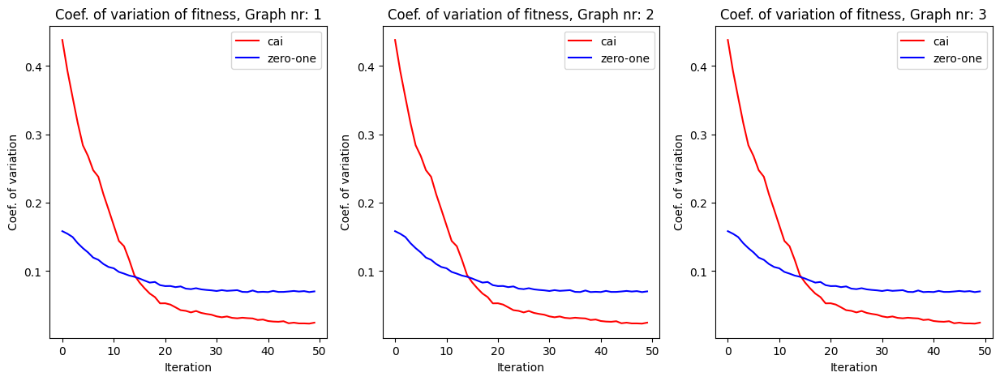

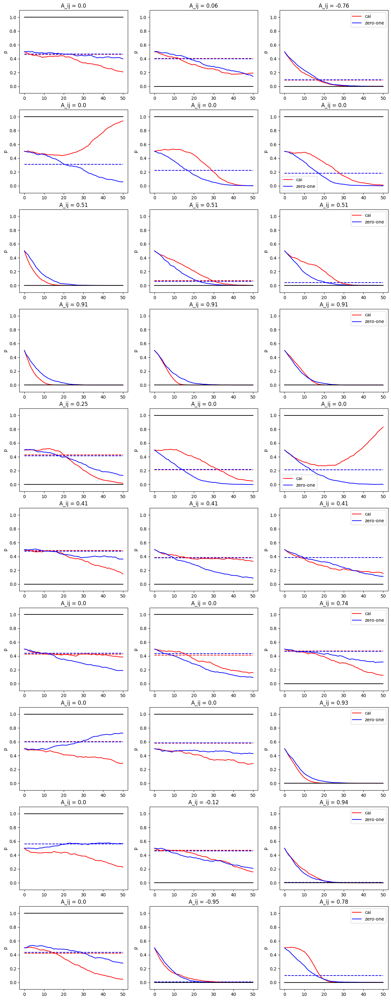

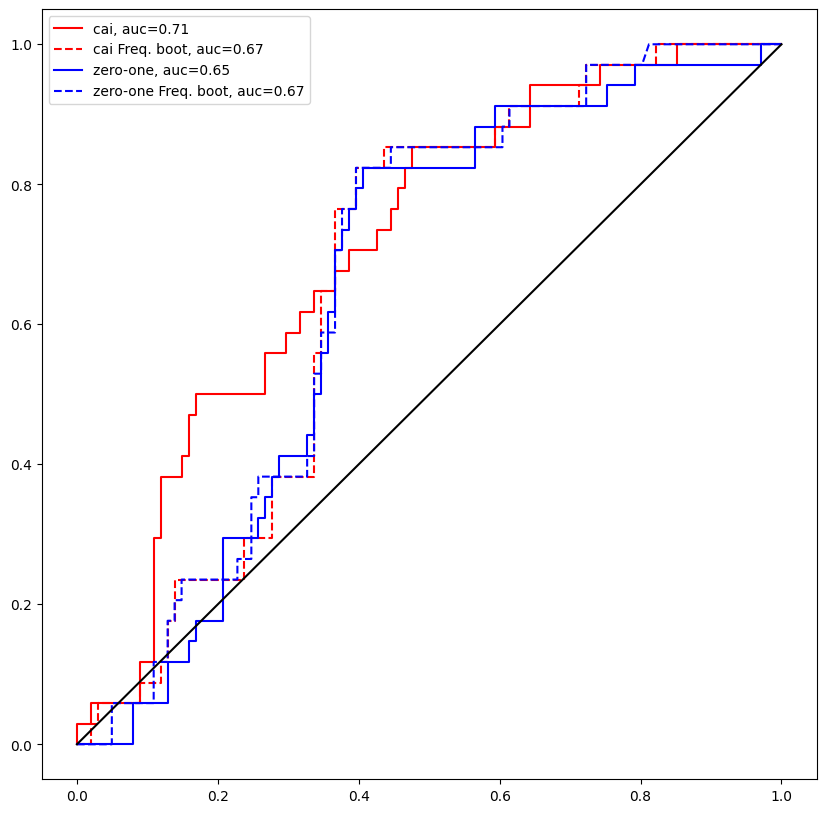

In [36]:
plot_coefvar_singles([cai, zo], ['cai', 'zero-one'], 10)
plot_singles([cai, zo], ['cai', 'zero-one'], 10,  nr_plot = 10)
plot_auc_singles([cai, zo], ['cai', 'zero-one'], it = 15, d = 10)

## Compare tail probabilities

In [37]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'cai'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.5_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp05 = pickle.load(handle)
    tp05['p_distribution'] = tp05['p']
    tp05['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.6_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp06 = pickle.load(handle)
    tp06['p_distribution'] = tp06['p']
    tp06['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.8_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp08 = pickle.load(handle)
    tp08['p_distribution'] = tp08['p']
    tp08['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp0.9_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    tp09 = pickle.load(handle)
    tp09['p_distribution'] = tp09['p']
    tp09['As'] = gen_local_change(10,spar)



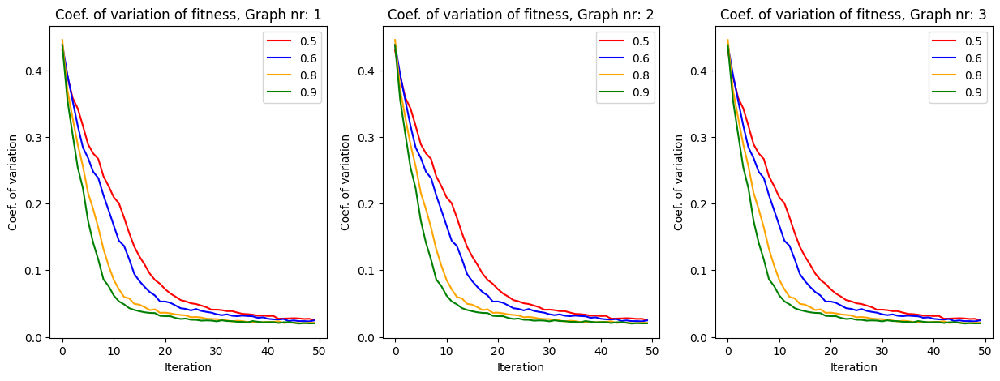

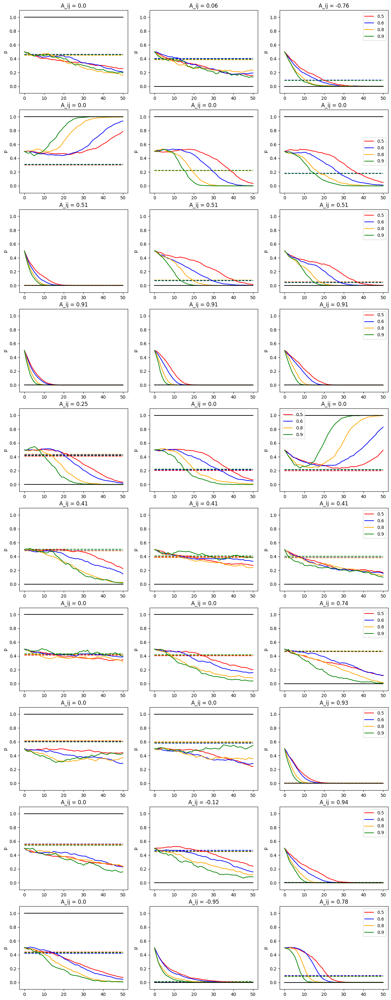

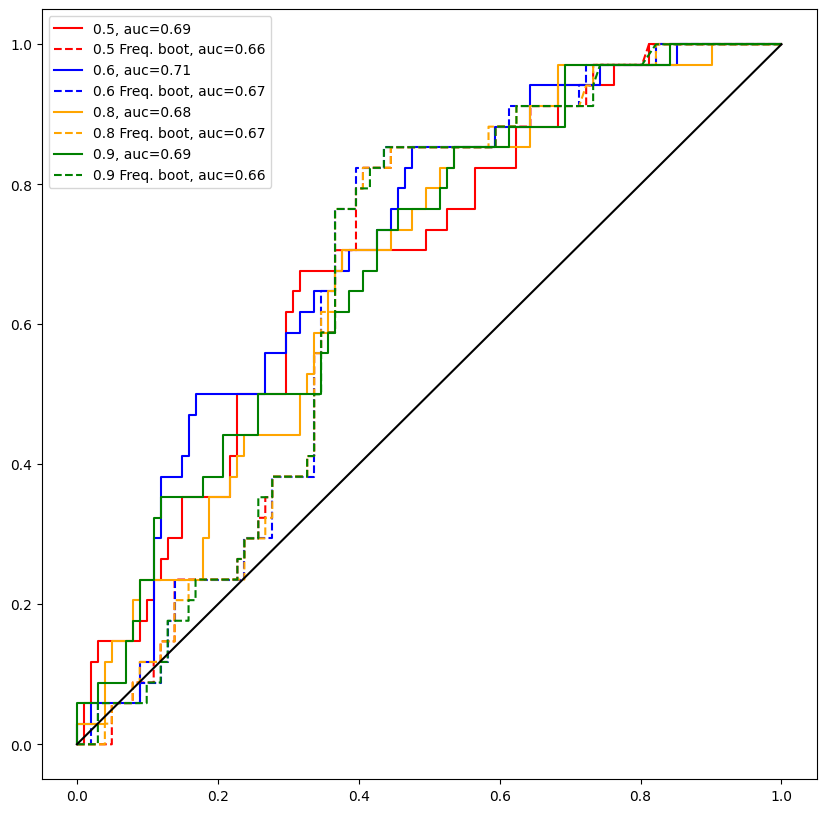

In [57]:
plot_coefvar_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], 10)
plot_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], 10,  nr_plot = 10)
plot_auc_singles([tp05, tp06, tp08, tp09], ['0.5', '0.6', '0.8', '0.9'], it = 15, d = 10)

## Compare number of iterations

In [38]:
tp = 0.6
s = 0.6
spar = 0.6
k = 0.05
a = 0.025
metric = 'zero-one'

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_5000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    CE5000 = pickle.load(handle)
    CE5000['p_distribution'] = CE5000['p']
    CE5000['As'] = gen_local_change(10,spar)

with open(f'C:/Users/ragna/OneDrive/GraphHypTest/single_sim_w50_20000_gaussian_False_{metric}_xs_xs_ew_s{s}_spar{spar}_tp{tp}_a{a}_k{k}_ni50_kTrue.pkl', 'rb') as handle:
    CE20000 = pickle.load(handle)
    CE20000['p_distribution'] = CE20000['p']
    CE20000['As'] = gen_local_change(10,spar)

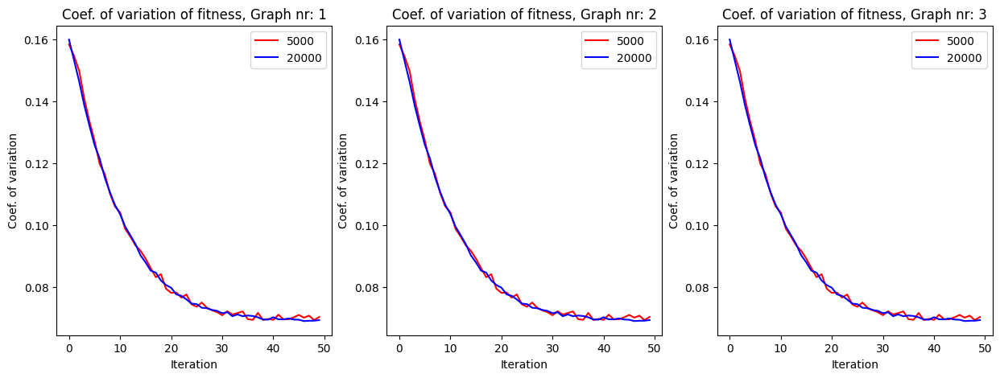

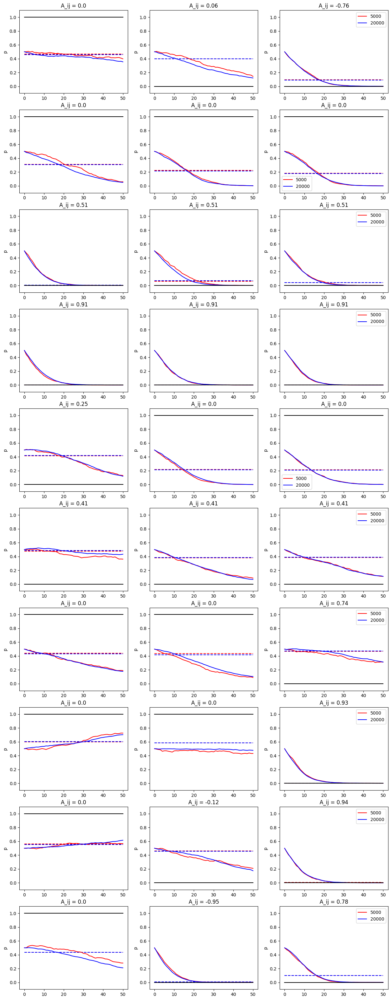

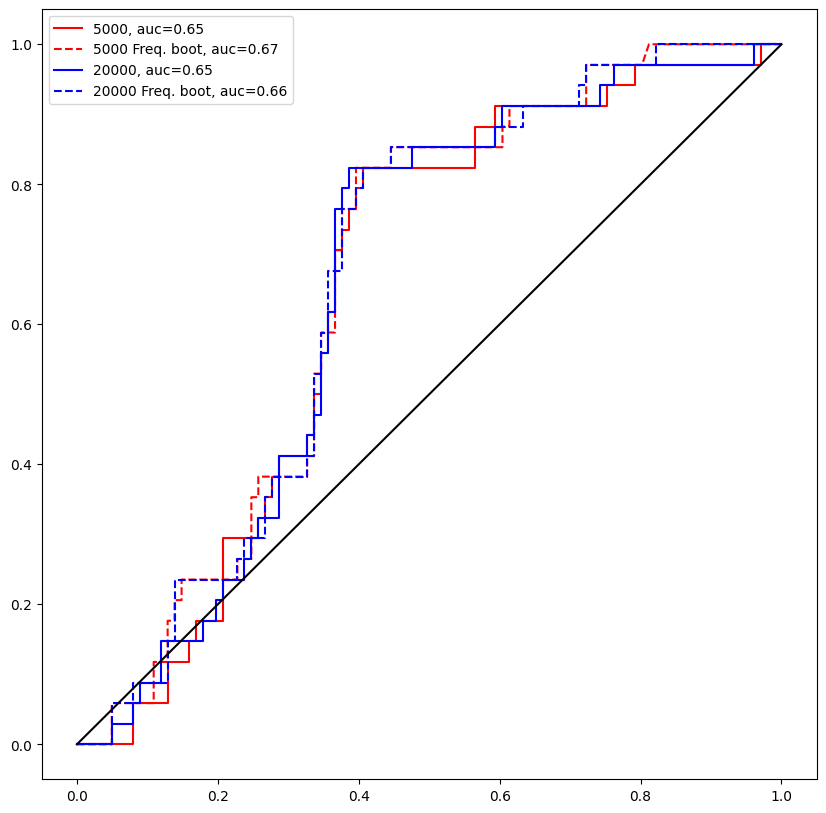

In [60]:
plot_coefvar_singles([CE5000, CE20000], ['5000', '20000'], 10)
plot_singles([CE5000, CE20000], ['5000', '20000'], 10,  nr_plot = 10)
plot_auc_singles([CE5000, CE20000], ['5000', '20000'], it = 15, d = 10)